# EY challenge 1 - PART 1
#### Author:  Dominik BENK

## Data preparation
This part of the solution was done completely in Microsoft Azure VM, as I was not able to set up the DataCube locally nor in Colab

In [ ]:
# Loading packages

%matplotlib inline
import tensorflow as tf
import sys
import numpy as np
import pandas as pd
import geopandas as gpd
from datetime import datetime
from datacube import Datacube
import matplotlib.pyplot as plt
sys.path.append("../scripts")
from dea_plotting import map_shapefile
from dea_spatialtools import xr_rasterize

In [ ]:
dc = Datacube(app="Getting started")

/env/lib/python3.6/site-packages/datacube/drivers/postgres/_connections.py:87: SADeprecationWarning: Calling URL() directly is deprecated and will be disabled in a future release.  The public constructor for URL is now the URL.create() method.
  username=username, password=password,


In [ ]:
# Loading files
vector_file = 'resources/fire_boundaries.shp'
gdf = gpd.read_file(vector_file)
linescan_datasets = dc.find_datasets(product='linescan')
linescan_datasets = sorted(linescan_datasets, key = lambda ds: (ds.center_time, ds.id))
train = pd.read_csv('resources/challenge1_train.csv', index_col='id')

In [ ]:
def clean_name(name):
    if name is None:
        res = None
    else:
        if name.upper()[-4::] == ".JPG":
            res = name.upper()[:-4].replace(' ','_')
        else:
            res = name.upper().replace(' ','_')
    return res

gdf['SourceNameClean'] = gdf.apply(lambda row: clean_name(row.SourceName), axis=1)
gdf.dtUTC = gdf.apply(lambda row: datetime.strptime(row.dtUTC, '%Y-%m-%d %H:%M:%S'), axis=1)
gdf.dtLocal = gdf.apply(lambda row: datetime.strptime(row.dtLocal, '%Y-%m-%d %H:%M:%S'), axis=1)

#### Defining composite mapping
- based on ids in composite label

In [ ]:
composite_dict = {
    'WALHALLA_397_P1_201902251311_MGA94_55' : 'Composite wallhalla 397,398 & 401 20190225 (1311 to 1342hrs)',
    'WALHALLA_398_P1_201902251323_MGA94_55' : 'Composite wallhalla 397,398 & 401 20190225 (1311 to 1342hrs)',
    'WALHALLA_401_P1_201902251342_MGA94_55' : 'Composite wallhalla 397,398 & 401 20190225 (1311 to 1342hrs)',
    'MACALISTER85_684_P1_201903080536_MGA94_55' : 'macalister 681 & 682, (684 & 685 minor) composite 0517-0539hrs',
    'MACALISTER91_681_P1_201903080517_MGA94_55' : 'macalister 681 & 682, (684 & 685 minor) composite 0517-0539hrs',
    'MACALISTER91_682_P1_201903080526_MGA94_55' : 'macalister 681 & 682, (684 & 685 minor) composite 0517-0539hrs',
    'MACALISTER91_685_P1_201903080539_MGA94_55' : 'macalister 681 & 682, (684 & 685 minor) composite 0517-0539hrs',
    'MACALISTER97_803_P1_201903161455_MGA94_55' : 'composite macalister97 803, 806 &  807 1455-1532hrs',
    'MACALISTER97_806_P1_201903161522_MGA94_55' : 'composite macalister97 803, 806 &  807 1455-1532hrs',
    'MACALISTER97_807_P1_201903161532_MGA94_55' : 'composite macalister97 803, 806 &  807 1455-1532hrs',
    'MACALISTER91_752_P1_201903111601_MGA94_55' : 'macalister91 751, 752, 755, 760, 761 & 762 composite 1549-1730hrs',
    'MACALISTER91_755_P1_201903111619_MGA94_55' : 'macalister91 751, 752, 755, 760, 761 & 762 composite 1549-1730hrs',
    'MACALISTER91_760_P1_201903111709_MGA94_55' : 'macalister91 751, 752, 755, 760, 761 & 762 composite 1549-1730hrs',
    'MACALISTER91_761_P1_201903111720_MGA94_55' : 'macalister91 751, 752, 755, 760, 761 & 762 composite 1549-1730hrs',
    'MACALISTER91_762_P1_201903111730_MGA94_55' : 'macalister91 751, 752, 755, 760, 761 & 762 composite 1549-1730hrs',
    'MACALISTER91_766_P1_201903131239_MGA94_55' : 'macalister91 766,767 & 770 composite 1239-1314hrs',
    'MACALISTER91_767_P1_201903131252_MGA94_55' : 'macalister91 766,767 & 770 composite 1239-1314hrs',
    'MACALISTER91_770_P1_201903131314_MGA94_55' : 'macalister91 766,767 & 770 composite 1239-1314hrs',
    'MACALISTER91_783_P1_201903141643_MGA94_55' : 'macalister91 775, 776, 779 & 783 composite 1345-1643hrs',
    'MACALISTER91_789_P1_201903151330_MGA94_55' : 'macalister91 789, 790 & 793 composite 1330-1358hrs',
    'MACALISTER91_790_P1_201903151340_MGA94_55' : 'macalister91 789, 790 & 793 composite 1330-1358hrs',
    'MACALISTER91_793_P1_201903151358_MGA94_55' : 'macalister91 789, 790 & 793 composite 1330-1358hrs',
    'MACALISTER91_804_P1_201903161503_MGA94_55' : 'macalister91 804, 805 & 808 composite 1503-1539hrs',
    'MACALISTER91_805_P1_201903161517_MGA94_55' : 'macalister91 804, 805 & 808 composite 1503-1539hrs',
    'MACALISTER91_808_P1_201903161539_MGA94_55' : 'macalister91 804, 805 & 808 composite 1503-1539hrs',
    'MACALISTER99_646_P1_201903070440_MGA94_55' : 'macalister91 646,648 & 649 composite - 0440hrs to 0453hrs',
    'MACALISTER91_99_649_P1_201903070453_MGA94_55' : 'macalister91 646,648 & 649 composite - 0440hrs to 0453hrs',
    'MACALISTER_695_P1_201903091542_MGA94_55' : 'macalister 695,698 & 699 composite 1542 - 1610hrs',
    'MACALISTER_698_P1_201903091600_MGA94_55' : 'macalister 695,698 & 699 composite 1542 - 1610hrs',
    'MACALISTER_699_P1_201903091610_MGA94_55' : 'macalister 695,698 & 699 composite 1542 - 1610hrs',
    'MACALISTER_696_P1_201903091545_MGA94_55' : 'macalister 696,697,700 - 1545-1613hrs',
    'MACALISTER_697_P1_201903091555_MGA94_55' : 'macalister 696,697,700 - 1545-1613hrs',
    'MACALISTER_700_P1_201903091613_MGA94_55' : 'macalister 696,697,700 - 1545-1613hrs',
    'WALHALLA_380_P1_201902061347_MGA94_55' : 'Composite wallhalla 380 & 381 20190206 (1347 & 1356hrs)',
    'WALHALLA_381_P1_201902061356_MGA94_55' : 'Composite wallhalla 380 & 381 20190206 (1347 & 1356hrs)'
}

#### Defining comment mapping
- few comments pointed to other polygons

In [ ]:
comments_dict = {
    'MACALISTER87_719_P1_201903100033_MGA94_55' : 'MACALISTER97_720_P1_201903100042_MGA94_55',
    'MACALISTER97_720_P1_201903100042_MGA94_55' : 'MACALISTER85_723_P1_201903100101_MGA94_55',
    'MACALISTER97_788_P1_201903151324_MGA94_55' : 'MACALISTER97_791_P1_201903151343_MGA94_55'
}

#### Inspecting all training linescans with its polygons

0 ABERFELDY_WEST_200_P1_201901260955_MGA94_55
1 ABERFELDY_WEST_214_P1_201901261750_MGA94_55
2 CREAM_JIM_JORDAN_217_P1_201901262218_MGA94_55
3 JORDAN_231_P1_201901271500_MGA94_55
4 JORDAN_234_P1_201901271901_MGA94_55
5 JORDAN_264_P1_201901301524_MGA94_55
6 MCCALLISTER79_LA_TROBE_97_266_P1_201901301552_MGA94_55
7 LA_TROBE_97_MCCALLISTER_79_268_P1_201901301611_MGA94_55
8 WALHALLA_295_P1_201902011156_MGA94_55
9 JORDAN_310_P1_201902012046_MGA94_55
10 WALHALLA_339_P1_201902030520_MGA94_55
11 WALHALLA_378_P1_201902041304_MGA94_55
12 WALHALLA_380_P1_201902061347_MGA94_55
13 WALHALLA_381_P1_201902061356_MGA94_55
14 WALHALLA_397_P1_201902251311_MGA94_55
15 WALHALLA_398_P1_201902251323_MGA94_55
16 WALHALLA_401_P1_201902251342_MGA94_55
17 MACALISTER91_615_P1_201903051438_MGA94_55
18 YARRA51_620_P1_201903051812_MGA94_55
19 MACALISTER99_623_P1_201903051858_MGA94_55
20 MACALISTER85_624_P1_201903051907_MGA94_55
21 YARRA51_633_P1_201903061644_MGA94_55
22 MACALISTER99_646_P1_201903070440_MGA94_55
23 MAC

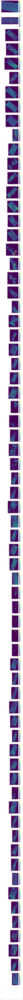

In [ ]:
masks = []
images_train = []
test_data = {}

fig, ax = plt.subplots(nrows=70, ncols=1, figsize=(15,700))

j = 0
for linescan in linescan_datasets:
    label = linescan.metadata_doc['label']
    if label in list(train.label):
        if label in list(composite_dict.keys()): 
            composite_label = composite_dict[label]
        else:
            composite_label = 'none'
            
        if label in list(comments_dict.keys()): 
            comment_label = comments_dict[label]
        else:
            comment_label = 'none'
            
        ob = gdf.loc[(gdf.SourceNameClean == label) | (gdf.SourceName == composite_label) | (gdf.SourceNameClean == comment_label)]
        if len(ob) == 0: continue
        print(j, label)
        src = dc.load(product='linescan', id=linescan.id, output_crs='epsg:28355', resolution=(-40,40))
        
        src.linescan.plot(ax=ax[j])
        ax[j].set_title(str(j) + ' - '+ label)
        ob.geometry.exterior.plot(ax=ax[j], edgecolor='red', linewidths=1)
        j+=1
        

#### Selecting linescans for modelling
- based on visual inspection, I have selected linescans that I believe that are reasonably good for training (no missing polygons, clear edges)

In [ ]:
selected_scans = ['ABERFELDY_WEST_200_P1_201901260955_MGA94_55','ABERFELDY_WEST_214_P1_201901261750_MGA94_55','CREAM_JIM_JORDAN_217_P1_201901262218_MGA94_55','JORDAN_231_P1_201901271500_MGA94_55','JORDAN_234_P1_201901271901_MGA94_55','JORDAN_264_P1_201901301524_MGA94_55','MCCALLISTER79_LA_TROBE_97_266_P1_201901301552_MGA94_55','LA_TROBE_97_MCCALLISTER_79_268_P1_201901301611_MGA94_55','WALHALLA_295_P1_201902011156_MGA94_55','WALHALLA_339_P1_201902030520_MGA94_55','WALHALLA_378_P1_201902041304_MGA94_55','MACALISTER99_623_P1_201903051858_MGA94_55','MACALISTER85_624_P1_201903051907_MGA94_55','YARRA51_633_P1_201903061644_MGA94_55','MACALISTER99_646_P1_201903070440_MGA94_55','MACALISTER91_682_P1_201903080526_MGA94_55','MACALISTER99_683_P1_201903080529_MGA94_55','MACALISTER85_684_P1_201903080536_MGA94_55','MACALISTER_697_P1_201903091555_MGA94_55','MACALISTER_700_P1_201903091613_MGA94_55','YARRA51_704_P1_201903091659_MGA94_55','MACALISTER87_719_P1_201903100033_MGA94_55','MACALISTER97_720_P1_201903100042_MGA94_55','MACALISTER85_723_P1_201903100101_MGA94_55','YARRA51_726_P1_201903100129_MGA94_55','MACALISTER91_752_P1_201903111601_MGA94_55','MACALISTER91_770_P1_201903131314_MGA94_55','MACALISTER91_783_P1_201903141643_MGA94_55','MACALISTER91_790_P1_201903151340_MGA94_55','MACALISTER91_804_P1_201903161503_MGA94_55','MACALISTER91_805_P1_201903161517_MGA94_55','MACALISTER91_808_P1_201903161539_MGA94_55']
len(selected_scans)

32

### Generating train and test data

In [ ]:
import numpy as np
from itertools import compress

# defining function that for a given size and stride creates "patches" from an image
def create_patches(image, size, stride):
    patches = []
    overlap = (size // stride) - 1
    w_pad = stride - image.shape[1] % stride
    h_pad = stride - image.shape[0] % stride
    image = tf.pad(image, [[0,h_pad],[0,w_pad]])
    
    w_patches = image.shape[1] // stride - overlap
    h_patches = image.shape[0] // stride - overlap
    
    for w in range(w_patches):
        for h in range(h_patches):
            patches.append(image[h * stride : h * stride + size,
                                 w * stride : w * stride + size])
    return patches


# generating data
masks = []
images_train = []
test_data = {}

## shuffle before generating patches
np.random.shuffle(linescan_datasets)

## parameters
size = 512 #size of patches
resolutions = [10, 20] #resolution of linescan
strides = [128, 64] #number of pixels that are skipped to generate a new patch

for linescan in linescan_datasets:
    label = linescan.metadata_doc['label']
    # train data
    if label in list(train.label):
        if label in selected_scans:
            # mapping composite labels
            if label in list(composite_dict.keys()): 
                composite_label = composite_dict[label]
            else:
                composite_label = 'none'
            # mapping comment labels
            if label in list(comments_dict.keys()): 
                comment_label = comments_dict[label]
            else:
                comment_label = 'none'
            # subsetting polygons
            ob = gdf.loc[(gdf.SourceNameClean == linescan.metadata_doc['label']) | (gdf.SourceName == composite_label) | (gdf.SourceNameClean == comment_label)]
            if len(ob) == 0: continue
            print(f'num of train polygons {len(ob)}')
            # generate image and mask patches for each resolution and stride
            for res, stride in zip(resolutions, strides):
                src = dc.load(product='linescan', id=linescan.id, output_crs='epsg:28355', resolution=(-res,res))
                image = src.linescan[0,:,:].values
                image_patches = create_patches(image, size=size, stride=stride)
                mask = xr_rasterize(gdf=ob, da=src).values
                mask_patches = create_patches(mask, size=size, stride=stride)
                if len(mask_patches) == 0:
                    continue
                # calculating total number of fire pixels in mask patch
                mask_sum = tf.math.reduce_sum(tf.cast(mask_patches,tf.int32),axis=(1,2))
                # calculating total number of nonzero pixels in image patch
                image_sum = tf.math.reduce_sum(tf.cast(tf.math.greater(tf.cast(image_patches,tf.int32),1), tf.int32),axis=(1,2))
                
                # subsetting only image patches with at least 75% nonzero pixels
                image_nonzero =  image_sum >= int(0.75*(size*size))
                # subsetting only mask patches with at least 1% fire pixels and at most 90% fire pixels
                mask_with_fire = ((mask_sum >= int(0.01*(size*size))) & (mask_sum <= int(0.9*(size*size))))
                subset = mask_with_fire & image_nonzero
                
                mask_patches = compress(mask_patches, subset)
                image_patches = compress(image_patches, subset)
                
                masks.extend(mask_patches)
                images_train.extend(image_patches)
            print(len(images_train))
            
    # test data
    else: 
        # saving whole images with resolution 20
        src = dc.load(product='linescan', id=linescan.id, output_crs='epsg:28355', resolution=(-20,20))
        image = src.linescan[0,:,:].values
        test_data[label] = image
    

print(f'total number of train patches: {len(images_train)}')

num of train polygons 3
Rasterizing to match xarray.DataArray dimensions (777, 1171)
Rasterizing to match xarray.DataArray dimensions (389, 586)
0
num of train polygons 5
Rasterizing to match xarray.DataArray dimensions (5355, 3357)
Rasterizing to match xarray.DataArray dimensions (2678, 1679)
155
num of train polygons 6
Rasterizing to match xarray.DataArray dimensions (5384, 3074)
Rasterizing to match xarray.DataArray dimensions (2693, 1538)
161
num of train polygons 14
Rasterizing to match xarray.DataArray dimensions (3164, 2068)
Rasterizing to match xarray.DataArray dimensions (1582, 1035)
323
num of train polygons 21
Rasterizing to match xarray.DataArray dimensions (4614, 3084)
Rasterizing to match xarray.DataArray dimensions (2307, 1542)
323
num of train polygons 1
Rasterizing to match xarray.DataArray dimensions (2847, 2720)
Rasterizing to match xarray.DataArray dimensions (1424, 1360)
323
num of train polygons 5
Rasterizing to match xarray.DataArray dimensions (5867, 3133)
Raste

#### Saving train data

In [ ]:
train_data = tf.data.Dataset.from_tensor_slices((tf.cast(images_train, tf.uint8), tf.cast(masks, tf.uint8)))
tf.data.experimental.save(train_data,'train_512_10_20')

#### Saving test data

In [ ]:
import pickle

# saving test images
file = open("test_data.pkl", "wb")
pickle.dump(test_data, file)
file.close()


# finding closest image coordinate for each test data point
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

test = pd.read_csv('resources/challenge1_test.csv', index_col='id')
for test_scan in test.label.unique():
    
    test_subset = test.loc[test.label == test_scan]
    src = dc.load(product='linescan', label=test_scan, output_crs='epsg:28355', resolution=(-20,20))
    
    mask = src.linescan
    ys = np.array(mask.coords['y'])
    xs = np.array(mask.coords['x'])
    
    for idx, observation in test_subset.iterrows():
        y = find_nearest(ys, float(observation.y))
        x = find_nearest(xs, float(observation.x))
        
        test.loc[(test.label==test_scan) & (test.x==observation.x) & (test.y==observation.y), 'y_image'] = y
        test.loc[(test.label==test_scan) & (test.x==observation.x) & (test.y==observation.y), 'x_image'] = x

# saving results for further use
test.to_csv('challenge1_test_coordinates.csv')

#### Inspecting test data with target coordinates

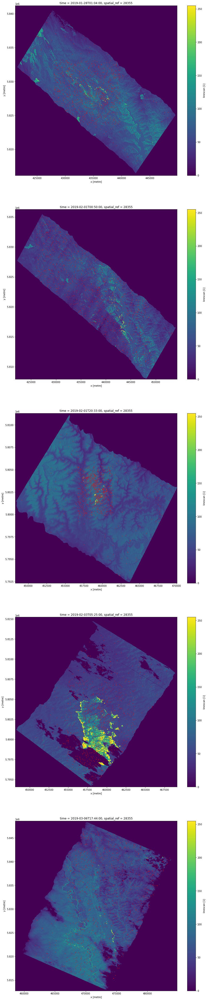

In [ ]:
test_idx = [32,37,40,44,76]

fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(15,75))

for j,idx in enumerate(test_idx):
    src= dc.load(product='linescan', id=linescan_datasets[idx].id, output_crs='epsg:28355', resolution=(-10,10))
    
    src.linescan.plot(ax=ax[j])
    subs = test.loc[test.label == linescan_datasets[idx].metadata_doc['label']]
    for i in range(len(subs.x)):
        ax[j].scatter(subs.x[i+1000*j],subs.y[i+1000*j],color = '#FF0000',s=1)